In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16, MobileNetV2, EfficientNetB3, InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator


load data

In [9]:
train_dir = 'F:/ttttt/fruit/Fruits Classification/train'
val_dir = 'F:/ttttt/fruit/Fruits Classification/valid'
test_dir = 'F:/ttttt/fruit/Fruits Classification//test'

Preprocess the Images

In [10]:
#Step 1: Set image and batch size
img_size = (224, 224)
batch_size = 32

#Step 2: Training Image Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    zoom_range=[0.8, 1.2],
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    brightness_range=[0.7, 1.3],
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode="reflect"
)

#Step 3: Validation & Test - Only Normalize
val_test_datagen = ImageDataGenerator(rescale=1./255)

#Step 4: Load Data from Manually Given Paths
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

#Step 5: Auto Class Detection
class_names = list(train_generator.class_indices.keys())
num_classes = len(class_names)

print("Detected Class Names:", class_names)
print("Number of Classes:", num_classes)

Found 9700 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
Found 100 images belonging to 5 classes.
Detected Class Names: ['Apple', 'Banana', 'Grape', 'Mango', 'Strawberry']
Number of Classes: 5


In [12]:
# Get the number of images from the DirectoryIterator objects
train_count = train_generator.n
valid_count = val_generator.n
test_count = test_generator.n


# Total number of images in all datasets
total_images = train_count + valid_count + test_count

# Calculate percentages
train_percentage = (train_count / total_images) * 100
valid_percentage = (valid_count / total_images) * 100
test_percentage = (test_count / total_images) * 100

print(f"Training Data: {train_count} images ({train_percentage:.2f}%)")
print(f"Validation Data: {valid_count} images ({valid_percentage:.2f}%)")
print(f"Test Data: {test_count} images ({test_percentage:.2f}%)")

Training Data: 9700 images (97.00%)
Validation Data: 200 images (2.00%)
Test Data: 100 images (1.00%)


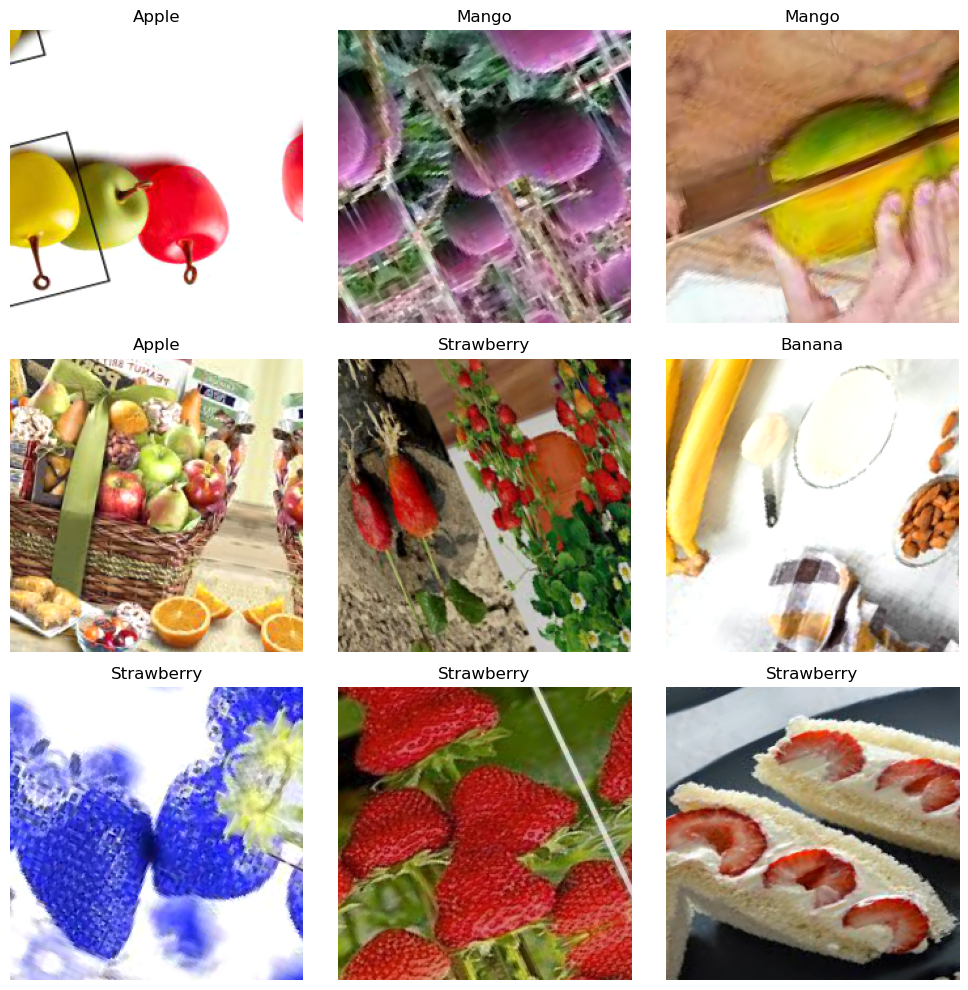

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot a batch of augmented training images
def show_augmented_images(generator, class_names, num_images=9):
    images, labels = next(generator)  # Get one batch of images and labels

    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        label_index = np.argmax(labels[i])
        plt.title(class_names[label_index])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Call the function with your training generator
show_augmented_images(train_generator, class_names)


#Model Building

Define a Universal Training Function

In [14]:
def train_model(model, model_name, train_generator, val_generator, epochs=15):
    checkpoint = ModelCheckpoint(f'{model_name}.h5', monitor='val_accuracy', save_best_only=True, verbose=1)
    early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=epochs,
        callbacks=[checkpoint, early_stop],
        verbose=1
    )
    return history


CNN (Simple Custom Model)

In [15]:
def build_cnn(num_classes, input_shape=(224, 224, 3)):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D(2, 2),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

cnn_model = build_cnn(num_classes=num_classes)
cnn_history = train_model(cnn_model, "CNN_Model", train_generator, val_generator, epochs=15)


C:\Users\user\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step - accuracy: 0.3871 - loss: 1.7864
Epoch 1: val_accuracy improved from -inf to 0.55000, saving model to CNN_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 171s 560ms/step - accuracy: 0.3873 - loss: 1.7851 - val_accuracy: 0.5500 - val_loss: 1.2000
Epoch 2/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.5113 - loss: 1.1858
Epoch 2: val_accuracy improved from 0.55000 to 0.58000, saving model to CNN_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 167s 550ms/step - accuracy: 0.5113 - loss: 1.1858 - val_accuracy: 0.5800 - val_loss: 1.0912
Epoch 3/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - accuracy: 0.5314 - loss: 1.1412
Epoch 3: val_accuracy did not improve from 0.58000
304/304 ━━━━━━━━━━━━━━━━━━━━ 170s 558ms/step - accuracy: 0.5314 - loss: 1.1411 - val_accuracy: 0.5300 - val_loss: 1.1539
Epoch 4/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.5380 - loss: 1.1182
Epoch 4: val_accuracy did not improve from 0.58000
304/304 ━━━━━━━━━━━━━━━━━━━━ 169s 555ms/step - accuracy: 0.5380 - loss: 1.1181 - val_accuracy: 0.5650 - val_loss: 1.0126
Epoch 5/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.5601 - loss: 1.0727
Epoch 5: val_accuracy improved from 0.58000 to 0.63000, saving model to CNN_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 172s 564ms/step - accuracy: 0.5601 - loss: 1.0727 - val_accuracy: 0.6300 - val_loss: 0.9406
Epoch 6/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step - accuracy: 0.5648 - loss: 1.0728
Epoch 6: val_accuracy did not improve from 0.63000
304/304 ━━━━━━━━━━━━━━━━━━━━ 168s 551ms/step - accuracy: 0.5649 - loss: 1.0727 - val_accuracy: 0.5950 - val_loss: 0.9679
Epoch 7/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.5842 - loss: 1.0377
Epoch 7: val_accuracy did not improve from 0.63000
304/304 ━━━━━━━━━━━━━━━━━━━━ 166s 544ms/step - accuracy: 0.5842 - loss: 1.0377 - val_accuracy: 0.6050 - val_loss: 0.9326
Epoch 8/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.5871 - loss: 1.0314
Epoch 8: val_accuracy did not improve from 0.63000
304/304 ━━━━━━━━━━━━━━━━━━━━ 169s 554ms/step - accuracy: 0.5871 - loss: 1.0314 - val_accuracy: 0.6250 - val_loss: 0.9392
Epoch 9/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.5987 - loss: 0.9893
Epoch 9: va

VGG16 (Transfer Learning)

In [16]:
def build_vgg16(num_classes, input_shape=(224, 224, 3)):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # freeze base

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

vgg16_model = build_vgg16(num_classes=num_classes)
vgg16_history = train_model(vgg16_model, "VGG16_Model", train_generator, val_generator, epochs=15)


Epoch 1/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3866 - loss: 1.4662
Epoch 1: val_accuracy improved from -inf to 0.63500, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - accuracy: 0.3869 - loss: 1.4657 - val_accuracy: 0.6350 - val_loss: 1.0008
Epoch 2/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5902 - loss: 1.0809
Epoch 2: val_accuracy improved from 0.63500 to 0.68500, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 475s 2s/step - accuracy: 0.5902 - loss: 1.0808 - val_accuracy: 0.6850 - val_loss: 0.8687
Epoch 3/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6311 - loss: 0.9685
Epoch 3: val_accuracy did not improve from 0.68500
304/304 ━━━━━━━━━━━━━━━━━━━━ 475s 2s/step - accuracy: 0.6311 - loss: 0.9684 - val_accuracy: 0.6700 - val_loss: 0.8519
Epoch 4/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6420 - loss: 0.9421
Epoch 4: val_accuracy improved from 0.68500 to 0.71500, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 474s 2s/step - accuracy: 0.6420 - loss: 0.9420 - val_accuracy: 0.7150 - val_loss: 0.7905
Epoch 5/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6768 - loss: 0.8710
Epoch 5: val_accuracy improved from 0.71500 to 0.72000, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 472s 2s/step - accuracy: 0.6768 - loss: 0.8710 - val_accuracy: 0.7200 - val_loss: 0.7628
Epoch 6/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6741 - loss: 0.8519
Epoch 6: val_accuracy did not improve from 0.72000
304/304 ━━━━━━━━━━━━━━━━━━━━ 472s 2s/step - accuracy: 0.6741 - loss: 0.8519 - val_accuracy: 0.7200 - val_loss: 0.7485
Epoch 7/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6914 - loss: 0.8411
Epoch 7: val_accuracy improved from 0.72000 to 0.73500, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 474s 2s/step - accuracy: 0.6914 - loss: 0.8411 - val_accuracy: 0.7350 - val_loss: 0.7390
Epoch 8/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6970 - loss: 0.8108
Epoch 8: val_accuracy did not improve from 0.73500
304/304 ━━━━━━━━━━━━━━━━━━━━ 473s 2s/step - accuracy: 0.6970 - loss: 0.8108 - val_accuracy: 0.7100 - val_loss: 0.7334
Epoch 9/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7002 - loss: 0.8222
Epoch 9: val_accuracy did not improve from 0.73500
304/304 ━━━━━━━━━━━━━━━━━━━━ 472s 2s/step - accuracy: 0.7002 - loss: 0.8222 - val_accuracy: 0.7200 - val_loss: 0.7325
Epoch 10/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7081 - loss: 0.7938
Epoch 10: val_accuracy improved from 0.73500 to 0.74000, saving model to VGG16_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 472s 2s/step - accuracy: 0.7081 - loss: 0.7938 - val_accuracy: 0.7400 - val_loss: 0.7062
Epoch 11/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7047 - loss: 0.7963
Epoch 11: val_accuracy did not improve from 0.74000
304/304 ━━━━━━━━━━━━━━━━━━━━ 473s 2s/step - accuracy: 0.7048 - loss: 0.7962 - val_accuracy: 0.7400 - val_loss: 0.6962
Epoch 12/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6997 - loss: 0.7827
Epoch 12: val_accuracy did not improve from 0.74000
304/304 ━━━━━━━━━━━━━━━━━━━━ 473s 2s/step - accuracy: 0.6997 - loss: 0.7827 - val_accuracy: 0.7100 - val_loss: 0.7052
Epoch 13/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7158 - loss: 0.7585
Epoch 13: val_accuracy did not improve from 0.74000
304/304 ━━━━━━━━━━━━━━━━━━━━ 473s 2s/step - accuracy: 0.7158 - loss: 0.7586 - val_accuracy: 0.7150 - val_loss: 0.6997
Epoch 14/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7262 - loss: 0.7436
Epoch 14: val_accuracy did n

MobileNetV2

In [17]:
def build_mobilenet(num_classes, input_shape=(224, 224, 3)):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

mobilenet_model = build_mobilenet(num_classes=num_classes)
mobilenet_history = train_model(mobilenet_model, "MobileNet_Model", train_generator, val_generator, epochs=15)


Epoch 1/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.6122 - loss: 1.0171
Epoch 1: val_accuracy improved from -inf to 0.76000, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 148s 477ms/step - accuracy: 0.6125 - loss: 1.0164 - val_accuracy: 0.7600 - val_loss: 0.5785
Epoch 2/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.7811 - loss: 0.6033
Epoch 2: val_accuracy improved from 0.76000 to 0.81000, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 144s 474ms/step - accuracy: 0.7811 - loss: 0.6032 - val_accuracy: 0.8100 - val_loss: 0.4742
Epoch 3/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.7913 - loss: 0.5691
Epoch 3: val_accuracy improved from 0.81000 to 0.84000, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 143s 471ms/step - accuracy: 0.7913 - loss: 0.5691 - val_accuracy: 0.8400 - val_loss: 0.4344
Epoch 4/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.8069 - loss: 0.5467
Epoch 4: val_accuracy improved from 0.84000 to 0.84500, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 144s 473ms/step - accuracy: 0.8069 - loss: 0.5467 - val_accuracy: 0.8450 - val_loss: 0.4326
Epoch 5/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.8225 - loss: 0.4897
Epoch 5: val_accuracy improved from 0.84500 to 0.86000, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 145s 477ms/step - accuracy: 0.8225 - loss: 0.4897 - val_accuracy: 0.8600 - val_loss: 0.4230
Epoch 6/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.8220 - loss: 0.4889
Epoch 6: val_accuracy improved from 0.86000 to 0.86500, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 144s 475ms/step - accuracy: 0.8220 - loss: 0.4889 - val_accuracy: 0.8650 - val_loss: 0.4076
Epoch 7/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8268 - loss: 0.4769
Epoch 7: val_accuracy improved from 0.86500 to 0.88000, saving model to MobileNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 144s 475ms/step - accuracy: 0.8268 - loss: 0.4769 - val_accuracy: 0.8800 - val_loss: 0.3821
Epoch 8/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.8335 - loss: 0.4638
Epoch 8: val_accuracy did not improve from 0.88000
304/304 ━━━━━━━━━━━━━━━━━━━━ 142s 469ms/step - accuracy: 0.8335 - loss: 0.4638 - val_accuracy: 0.8600 - val_loss: 0.3820
Epoch 9/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step - accuracy: 0.8342 - loss: 0.4578
Epoch 9: val_accuracy did not improve from 0.88000
304/304 ━━━━━━━━━━━━━━━━━━━━ 142s 466ms/step - accuracy: 0.8342 - loss: 0.4578 - val_accuracy: 0.8650 - val_loss: 0.3667
Epoch 10/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8421 - loss: 0.4355
Epoch 10: val_accuracy did not improve from 0.88000
304/304 ━━━━━━━━━━━━━━━━━━━━ 142s 467ms/step - accuracy: 0.8421 - loss: 0.4356 - val_accuracy: 0.8800 - val_loss: 0.3806
Epoch 11/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8455 - loss: 0.4188
Epoch 11

EfficientNetB3

In [18]:
def build_efficientnet(num_classes, input_shape=(224, 224, 3)):
    base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

efficientnet_model = build_efficientnet(num_classes=num_classes)
efficientnet_history = train_model(efficientnet_model, "EfficientNet_Model", train_generator, val_generator, epochs=15)


Epoch 1/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 858ms/step - accuracy: 0.2060 - loss: 1.6384
Epoch 1: val_accuracy improved from -inf to 0.20000, saving model to EfficientNet_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 283s 898ms/step - accuracy: 0.2059 - loss: 1.6384 - val_accuracy: 0.2000 - val_loss: 1.6095
Epoch 2/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 856ms/step - accuracy: 0.1913 - loss: 1.6099
Epoch 2: val_accuracy did not improve from 0.20000
304/304 ━━━━━━━━━━━━━━━━━━━━ 265s 872ms/step - accuracy: 0.1913 - loss: 1.6099 - val_accuracy: 0.2000 - val_loss: 1.6095
Epoch 3/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 856ms/step - accuracy: 0.1913 - loss: 1.6097
Epoch 3: val_accuracy did not improve from 0.20000
304/304 ━━━━━━━━━━━━━━━━━━━━ 265s 872ms/step - accuracy: 0.1914 - loss: 1.6097 - val_accuracy: 0.2000 - val_loss: 1.6095
Epoch 4/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 852ms/step - accuracy: 0.2033 - loss: 1.6095
Epoch 4: val_accuracy did not improve from 0.20000
304/304 ━━━━━━━━━━━━━━━━━━━━ 264s 868ms/step - accuracy: 0.2032 - loss: 1.6095 - val_accuracy: 0.2000 - val_loss: 1.6094
Epoch 5/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 859ms/step - accuracy: 0.1944 - loss: 1.6096
Epoch 5: va

InceptionV3

In [19]:
def build_inception(num_classes, input_shape=(224, 224, 3)):
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

inception_model = build_inception(num_classes=num_classes)
inception_history = train_model(inception_model, "Inception_Model", train_generator, val_generator, epochs=15)


Epoch 1/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 571ms/step - accuracy: 0.5845 - loss: 1.1111
Epoch 1: val_accuracy improved from -inf to 0.78000, saving model to Inception_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 187s 601ms/step - accuracy: 0.5848 - loss: 1.1104 - val_accuracy: 0.7800 - val_loss: 0.5234
Epoch 2/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.7321 - loss: 0.7270
Epoch 2: val_accuracy improved from 0.78000 to 0.81000, saving model to Inception_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 183s 602ms/step - accuracy: 0.7321 - loss: 0.7270 - val_accuracy: 0.8100 - val_loss: 0.5086
Epoch 3/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 580ms/step - accuracy: 0.7369 - loss: 0.7285
Epoch 3: val_accuracy improved from 0.81000 to 0.83000, saving model to Inception_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 185s 607ms/step - accuracy: 0.7369 - loss: 0.7284 - val_accuracy: 0.8300 - val_loss: 0.4915
Epoch 4/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - accuracy: 0.7499 - loss: 0.6674
Epoch 4: val_accuracy improved from 0.83000 to 0.83500, saving model to Inception_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 181s 594ms/step - accuracy: 0.7499 - loss: 0.6674 - val_accuracy: 0.8350 - val_loss: 0.4498
Epoch 5/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.7584 - loss: 0.6458
Epoch 5: val_accuracy did not improve from 0.83500
304/304 ━━━━━━━━━━━━━━━━━━━━ 176s 577ms/step - accuracy: 0.7584 - loss: 0.6459 - val_accuracy: 0.8250 - val_loss: 0.4590
Epoch 6/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.7714 - loss: 0.6121
Epoch 6: val_accuracy improved from 0.83500 to 0.84500, saving model to Inception_Model.h5


304/304 ━━━━━━━━━━━━━━━━━━━━ 184s 604ms/step - accuracy: 0.7714 - loss: 0.6121 - val_accuracy: 0.8450 - val_loss: 0.4630
Epoch 7/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - accuracy: 0.7712 - loss: 0.6454
Epoch 7: val_accuracy did not improve from 0.84500
304/304 ━━━━━━━━━━━━━━━━━━━━ 176s 579ms/step - accuracy: 0.7712 - loss: 0.6454 - val_accuracy: 0.8450 - val_loss: 0.4181
Epoch 8/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - accuracy: 0.7750 - loss: 0.6084
Epoch 8: val_accuracy did not improve from 0.84500
304/304 ━━━━━━━━━━━━━━━━━━━━ 176s 578ms/step - accuracy: 0.7750 - loss: 0.6084 - val_accuracy: 0.8350 - val_loss: 0.4163
Epoch 9/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 584ms/step - accuracy: 0.7790 - loss: 0.5884
Epoch 9: val_accuracy did not improve from 0.84500
304/304 ━━━━━━━━━━━━━━━━━━━━ 180s 593ms/step - accuracy: 0.7790 - loss: 0.5884 - val_accuracy: 0.8400 - val_loss: 0.4200
Epoch 10/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 578ms/step - accuracy: 0.7851 - loss: 0.5953
Epoch 10: 

304/304 ━━━━━━━━━━━━━━━━━━━━ 183s 602ms/step - accuracy: 0.7851 - loss: 0.5953 - val_accuracy: 0.8650 - val_loss: 0.4276
Epoch 11/15
304/304 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.7769 - loss: 0.6005
Epoch 11: val_accuracy did not improve from 0.86500
304/304 ━━━━━━━━━━━━━━━━━━━━ 179s 587ms/step - accuracy: 0.7769 - loss: 0.6005 - val_accuracy: 0.8550 - val_loss: 0.4358


#Model Evaluation & Visualization

Plot Accuracy and Loss Curves

In [20]:
def evaluate_model_performance(model, history, test_generator, model_name):
    # Extract training and validation history
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(len(acc))

    # Evaluate on test data
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=0)
    test_acc_line = [test_accuracy] * len(acc)
    test_loss_line = [test_loss] * len(loss)

    # Plot Accuracy and Loss
    plt.figure(figsize=(16, 6))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.plot(epochs_range, test_acc_line, 'r--', label=f'Test Accuracy ({test_accuracy*100:.2f}%)')
    plt.title(f'{model_name} - Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.plot(epochs_range, test_loss_line, 'r--', label=f'Test Loss ({test_loss:.4f})')
    plt.title(f'{model_name} - Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle(f'{model_name} - Performance Summary', fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # Print test performance
    print(f"✅ Final Test Accuracy for {model_name}: {test_accuracy * 100:.2f}%")
    print(f"📉 Final Test Loss for {model_name}: {test_loss * 100:.2f}%")


Example Usage

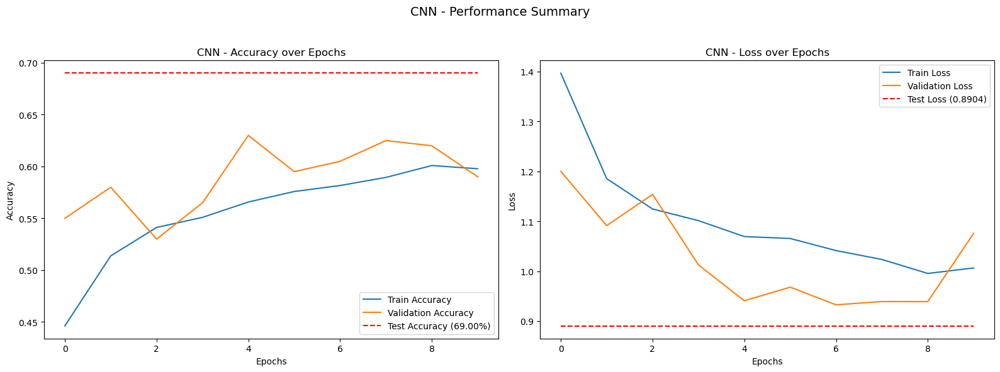

✅ Final Test Accuracy for CNN: 69.00%
📉 Final Test Loss for CNN: 89.04%


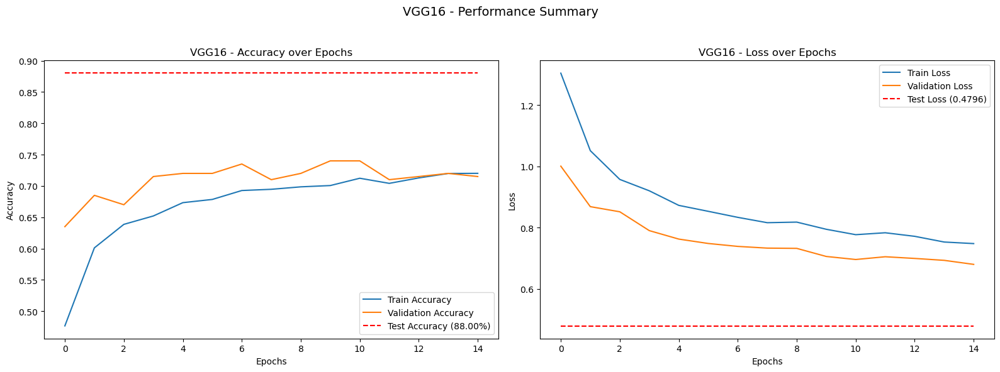

✅ Final Test Accuracy for VGG16: 88.00%
📉 Final Test Loss for VGG16: 47.96%


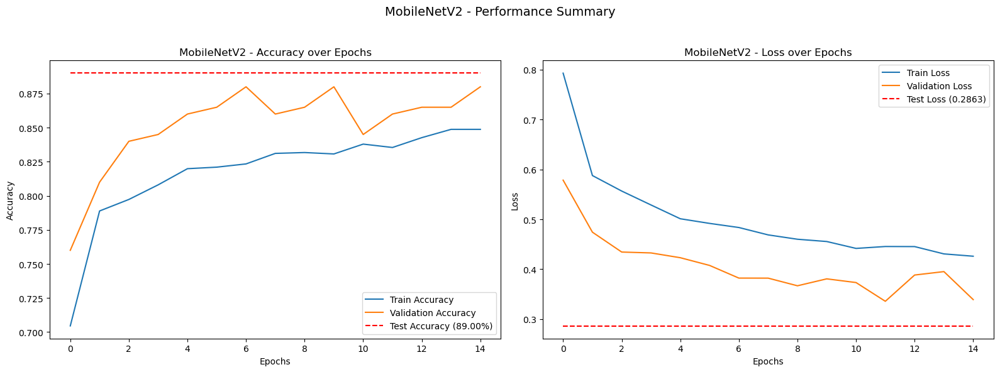

✅ Final Test Accuracy for MobileNetV2: 89.00%
📉 Final Test Loss for MobileNetV2: 28.63%


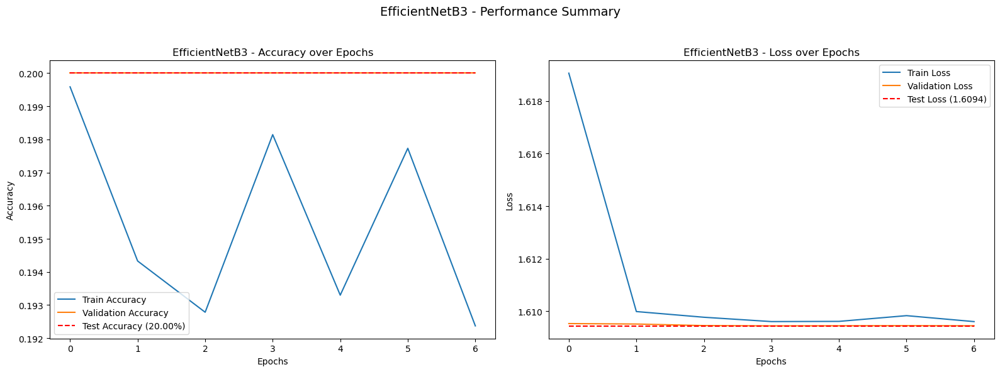

✅ Final Test Accuracy for EfficientNetB3: 20.00%
📉 Final Test Loss for EfficientNetB3: 160.94%


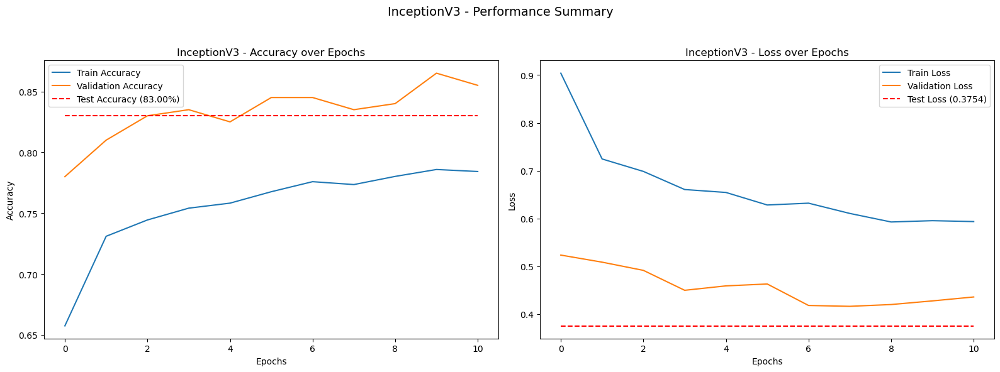

✅ Final Test Accuracy for InceptionV3: 83.00%
📉 Final Test Loss for InceptionV3: 37.54%


In [21]:
evaluate_model_performance(cnn_model, cnn_history, test_generator, "CNN")
evaluate_model_performance(vgg16_model, vgg16_history, test_generator, "VGG16")
evaluate_model_performance(mobilenet_model, mobilenet_history, test_generator, "MobileNetV2")
evaluate_model_performance(efficientnet_model, efficientnet_history, test_generator, "EfficientNetB3")
evaluate_model_performance(inception_model, inception_history, test_generator, "InceptionV3")


Confusion Matrix & Classification Report

In [22]:
def evaluate_model(model, test_generator, class_names, model_name):
    # Predict
    predictions = model.predict(test_generator)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes

    # Classification Report
    print(f"📋 Classification Report for {model_name}:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


Example Usage

100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
📋 Classification Report for CNN:

              precision    recall  f1-score   support

       Apple       0.71      0.50      0.59        20
      Banana       0.53      0.80      0.64        20
       Grape       0.88      0.70      0.78        20
       Mango       0.67      0.60      0.63        20
  Strawberry       0.77      0.85      0.81        20

    accuracy                           0.69       100
   macro avg       0.71      0.69      0.69       100
weighted avg       0.71      0.69      0.69       100



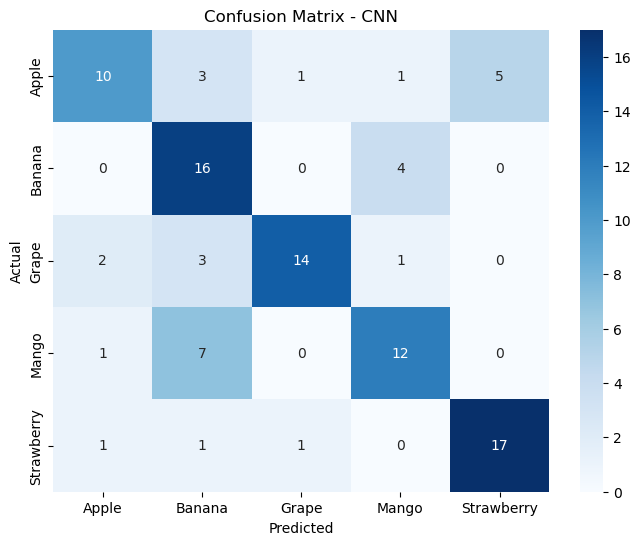

100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step
📋 Classification Report for VGG16:

              precision    recall  f1-score   support

       Apple       0.93      0.65      0.76        20
      Banana       0.90      0.90      0.90        20
       Grape       0.87      1.00      0.93        20
       Mango       0.86      0.90      0.88        20
  Strawberry       0.86      0.95      0.90        20

    accuracy                           0.88       100
   macro avg       0.88      0.88      0.88       100
weighted avg       0.88      0.88      0.88       100



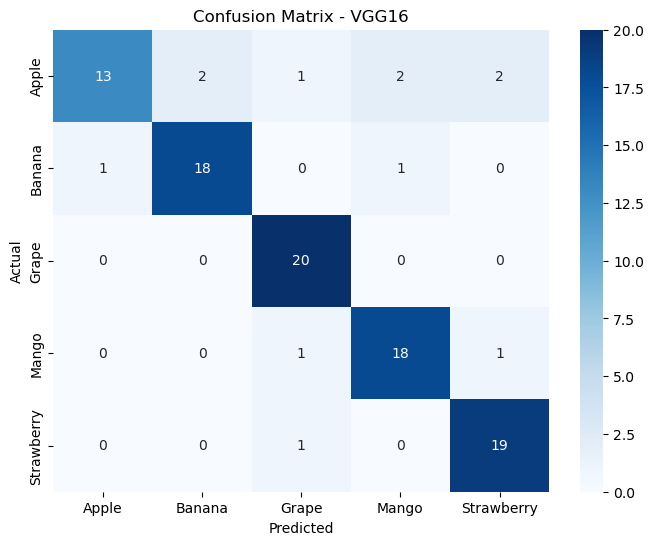

100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
📋 Classification Report for MobileNetV2:

              precision    recall  f1-score   support

       Apple       0.81      0.85      0.83        20
      Banana       0.90      0.95      0.93        20
       Grape       0.94      0.85      0.89        20
       Mango       0.86      0.90      0.88        20
  Strawberry       0.95      0.90      0.92        20

    accuracy                           0.89       100
   macro avg       0.89      0.89      0.89       100
weighted avg       0.89      0.89      0.89       100



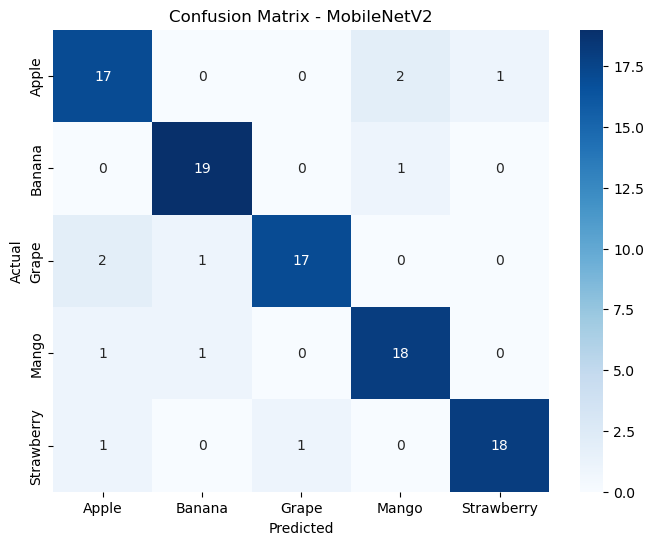

100/100 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step
📋 Classification Report for EfficientNetB3:

              precision    recall  f1-score   support

       Apple       0.00      0.00      0.00        20
      Banana       0.00      0.00      0.00        20
       Grape       0.00      0.00      0.00        20
       Mango       0.20      1.00      0.33        20
  Strawberry       0.00      0.00      0.00        20

    accuracy                           0.20       100
   macro avg       0.04      0.20      0.07       100
weighted avg       0.04      0.20      0.07       100



c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


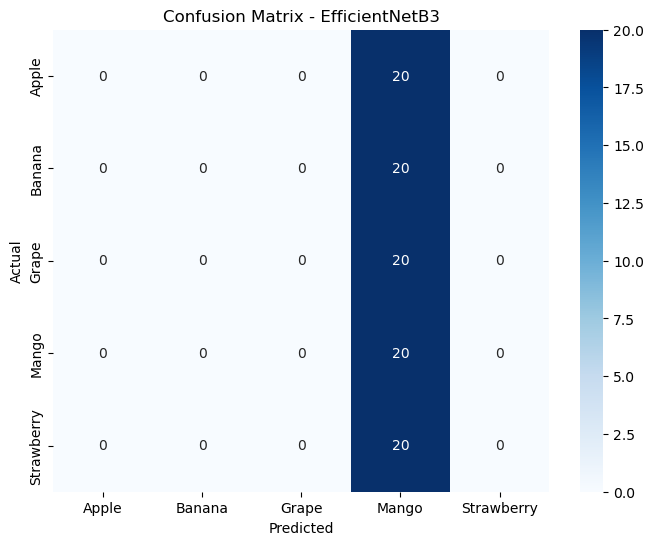

100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step
📋 Classification Report for InceptionV3:

              precision    recall  f1-score   support

       Apple       0.70      0.70      0.70        20
      Banana       0.90      0.90      0.90        20
       Grape       0.95      1.00      0.98        20
       Mango       0.76      0.65      0.70        20
  Strawberry       0.82      0.90      0.86        20

    accuracy                           0.83       100
   macro avg       0.83      0.83      0.83       100
weighted avg       0.83      0.83      0.83       100



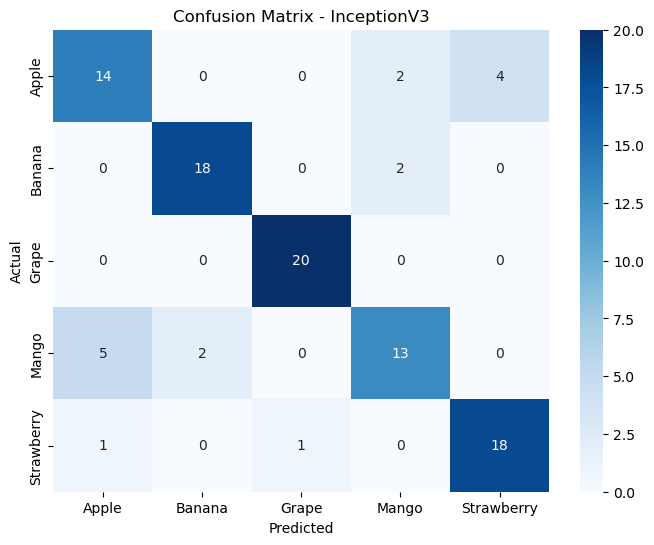

In [23]:
evaluate_model(cnn_model, test_generator, class_names, "CNN")
evaluate_model(vgg16_model, test_generator, class_names, "VGG16")
evaluate_model(mobilenet_model, test_generator, class_names, "MobileNetV2")
evaluate_model(efficientnet_model, test_generator, class_names, "EfficientNetB3")
evaluate_model(inception_model, test_generator, class_names, "InceptionV3")

report generate

In [24]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np

def evaluate_with_confusion_matrix(model, test_generator, model_name, class_names):
    # Predict class probabilities
    predictions = model.predict(test_generator)
    predicted_classes = np.argmax(predictions, axis=1)

    # True classes
    true_classes = test_generator.classes

    # Confusion Matrix
    cm = confusion_matrix(true_classes, predicted_classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, xticks_rotation=45, values_format='d')
    plt.title(f"{model_name} - Confusion Matrix")
    plt.grid(False)
    plt.show()

    # Classification Report
    print(f"\n📊 Classification Report for {model_name}:\n")
    report = classification_report(true_classes, predicted_classes, target_names=class_names)
    print(report)


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


<Figure size 800x600 with 0 Axes>

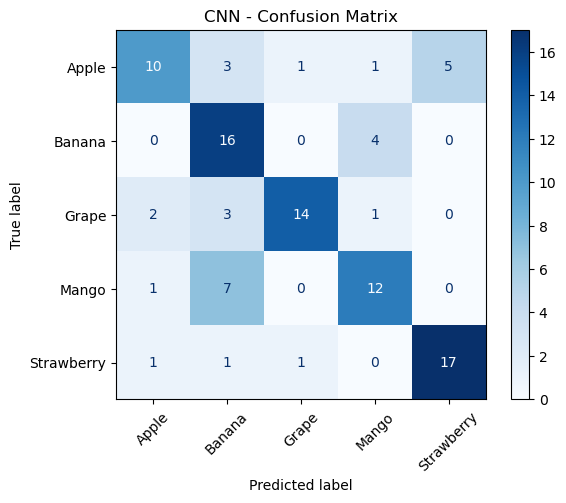


📊 Classification Report for CNN:

              precision    recall  f1-score   support

       Apple       0.71      0.50      0.59        20
      Banana       0.53      0.80      0.64        20
       Grape       0.88      0.70      0.78        20
       Mango       0.67      0.60      0.63        20
  Strawberry       0.77      0.85      0.81        20

    accuracy                           0.69       100
   macro avg       0.71      0.69      0.69       100
weighted avg       0.71      0.69      0.69       100

100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step


<Figure size 800x600 with 0 Axes>

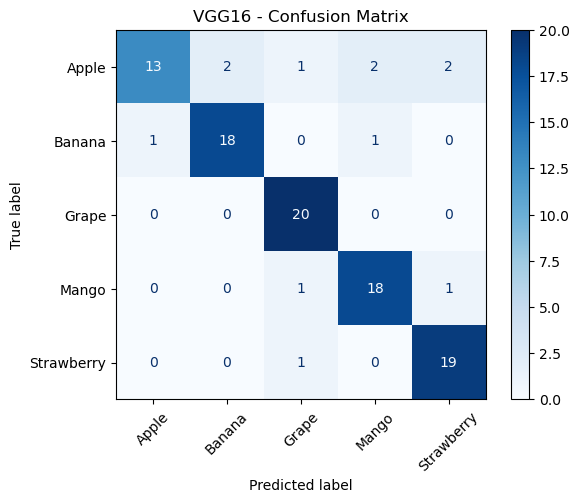


📊 Classification Report for VGG16:

              precision    recall  f1-score   support

       Apple       0.93      0.65      0.76        20
      Banana       0.90      0.90      0.90        20
       Grape       0.87      1.00      0.93        20
       Mango       0.86      0.90      0.88        20
  Strawberry       0.86      0.95      0.90        20

    accuracy                           0.88       100
   macro avg       0.88      0.88      0.88       100
weighted avg       0.88      0.88      0.88       100

100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step


<Figure size 800x600 with 0 Axes>

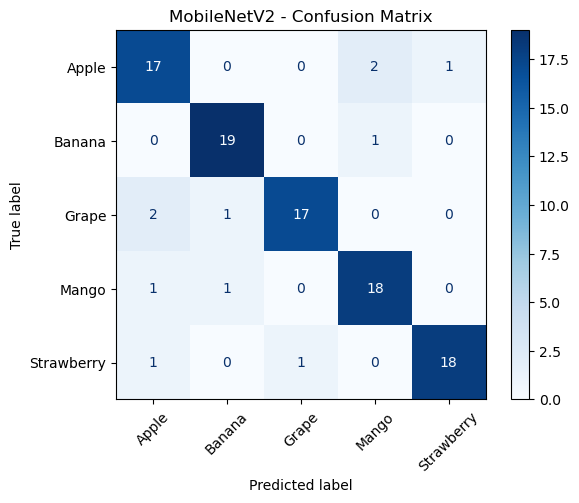


📊 Classification Report for MobileNetV2:

              precision    recall  f1-score   support

       Apple       0.81      0.85      0.83        20
      Banana       0.90      0.95      0.93        20
       Grape       0.94      0.85      0.89        20
       Mango       0.86      0.90      0.88        20
  Strawberry       0.95      0.90      0.92        20

    accuracy                           0.89       100
   macro avg       0.89      0.89      0.89       100
weighted avg       0.89      0.89      0.89       100

100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step


<Figure size 800x600 with 0 Axes>

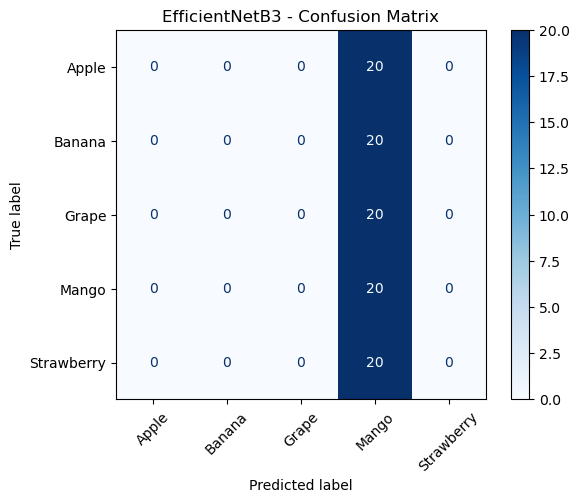


📊 Classification Report for EfficientNetB3:

              precision    recall  f1-score   support

       Apple       0.00      0.00      0.00        20
      Banana       0.00      0.00      0.00        20
       Grape       0.00      0.00      0.00        20
       Mango       0.20      1.00      0.33        20
  Strawberry       0.00      0.00      0.00        20

    accuracy                           0.20       100
   macro avg       0.04      0.20      0.07       100
weighted avg       0.04      0.20      0.07       100

  5/100 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step

c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step


<Figure size 800x600 with 0 Axes>

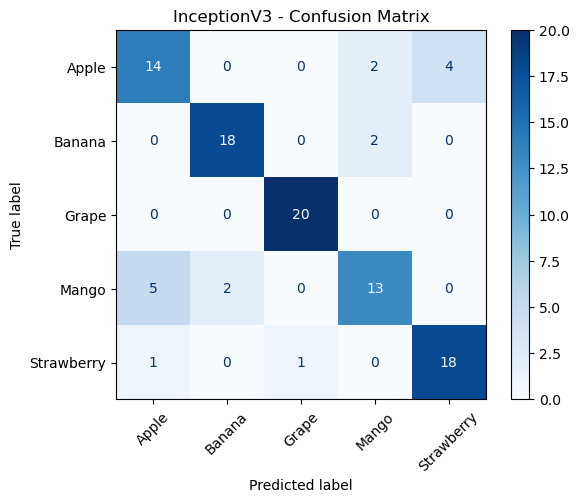


📊 Classification Report for InceptionV3:

              precision    recall  f1-score   support

       Apple       0.70      0.70      0.70        20
      Banana       0.90      0.90      0.90        20
       Grape       0.95      1.00      0.98        20
       Mango       0.76      0.65      0.70        20
  Strawberry       0.82      0.90      0.86        20

    accuracy                           0.83       100
   macro avg       0.83      0.83      0.83       100
weighted avg       0.83      0.83      0.83       100



In [25]:
evaluate_with_confusion_matrix(cnn_model, test_generator, "CNN", class_names)
evaluate_with_confusion_matrix(vgg16_model, test_generator, "VGG16", class_names)
evaluate_with_confusion_matrix(mobilenet_model, test_generator, "MobileNetV2", class_names)
evaluate_with_confusion_matrix(efficientnet_model, test_generator, "EfficientNetB3", class_names)
evaluate_with_confusion_matrix(inception_model, test_generator, "InceptionV3", class_names)


Image Prediction from File Path

In [26]:
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image(model, image_path, class_names, target_size=(224, 224)):
    # Load and preprocess image
    img = image.load_img(image_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  # normalize
    img_array = np.expand_dims(img_array, axis=0)  # batch dimension

    # Prediction
    prediction = model.predict(img_array)
    predicted_class_index = np.argmax(prediction)
    predicted_class = class_names[predicted_class_index]
    confidence = prediction[0][predicted_class_index]

    # Show image and prediction
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class} ({confidence * 100:.2f}%)")
    plt.show()

    return predicted_class, confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


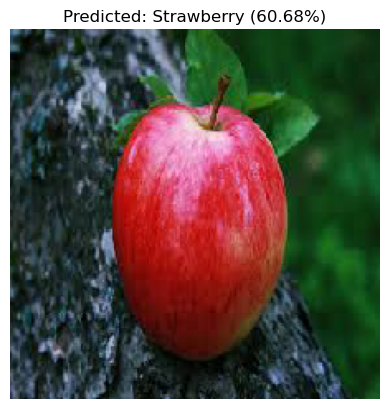

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


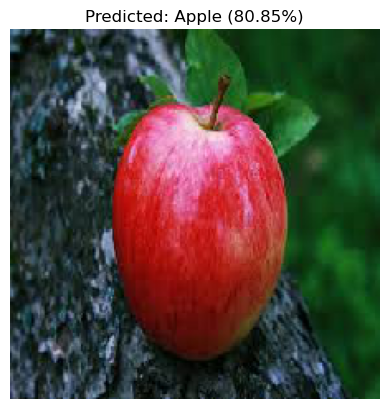

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


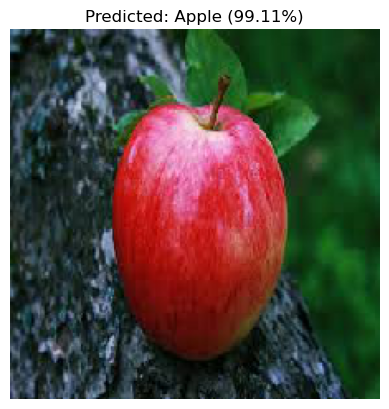

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


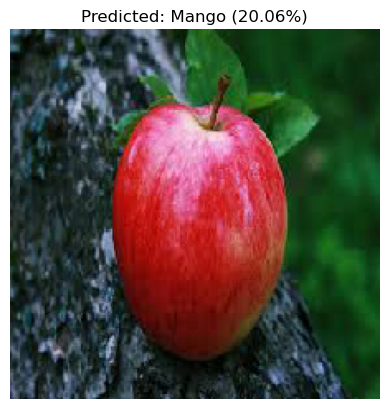

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


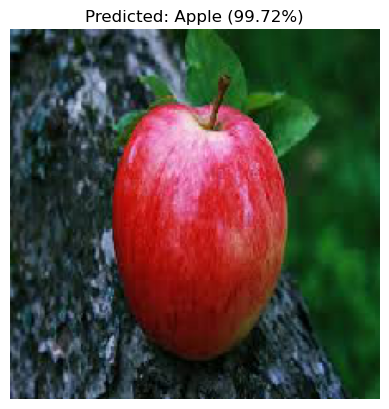

('Apple', 0.99717367)

In [27]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Apple/Apple (233).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


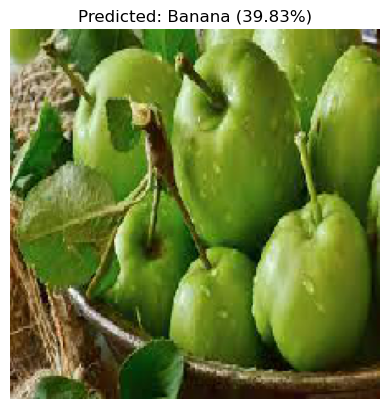

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


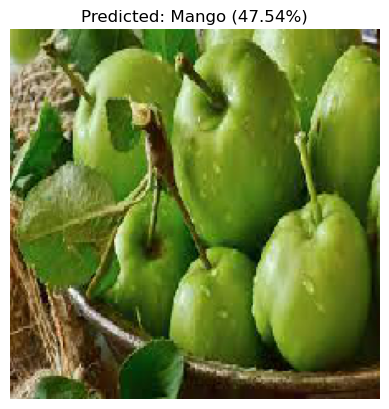

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


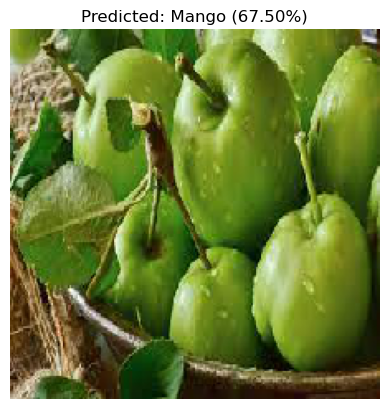

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


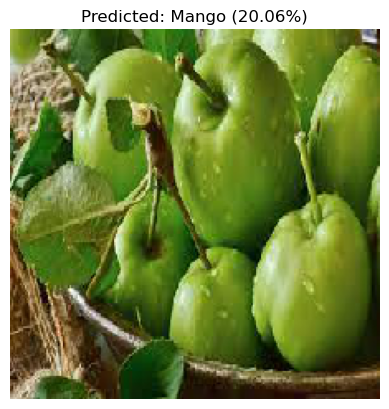

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


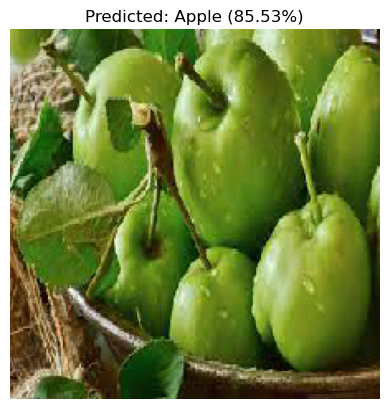

('Apple', 0.8553492)

In [28]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Apple/Apple (1789).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


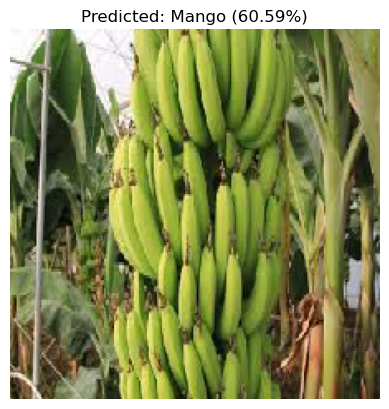

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


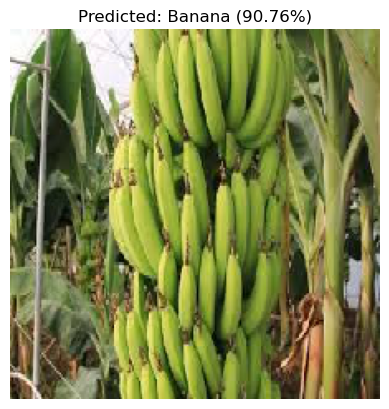

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


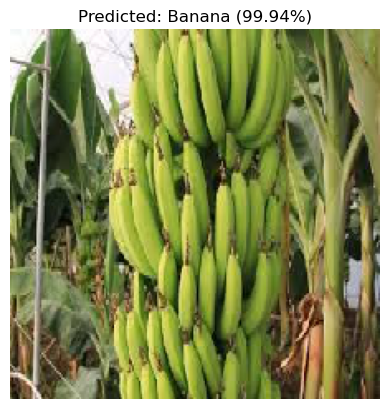

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


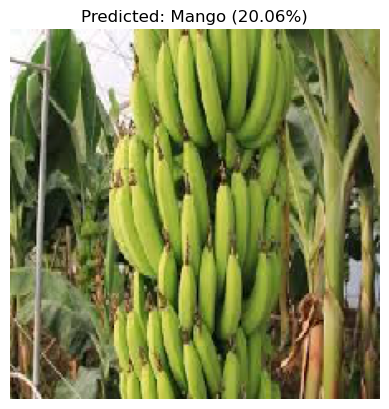

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


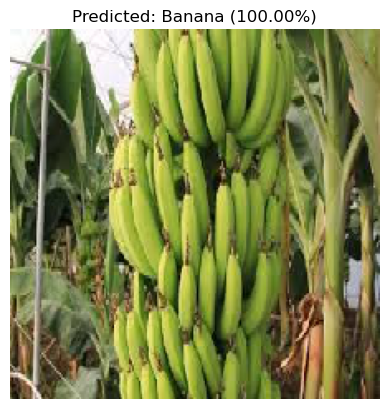

('Banana', 0.9999987)

In [29]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Banana/Banana (2121).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


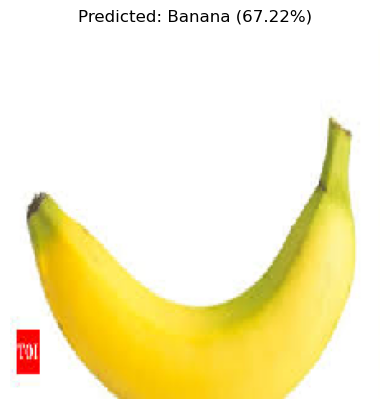

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


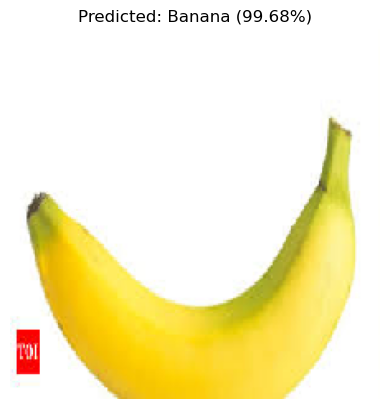

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


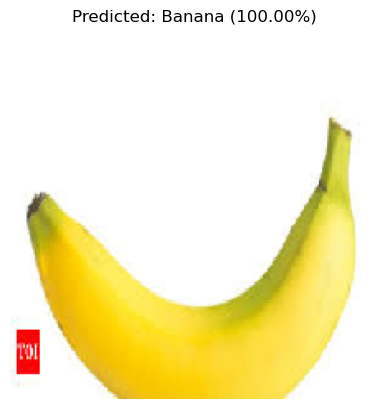

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


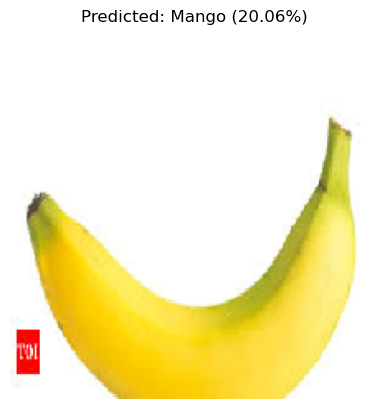

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


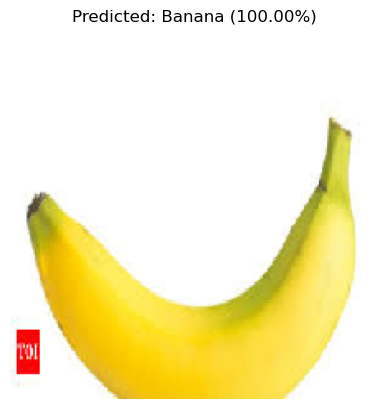

('Banana', 0.99997795)

In [30]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Banana/Banana (2580).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


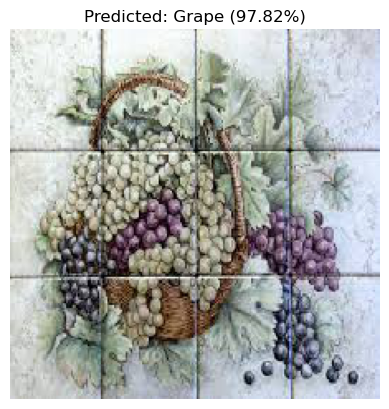

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


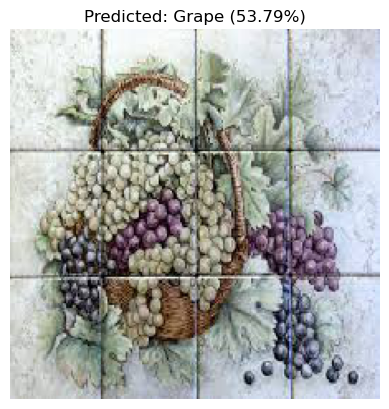

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


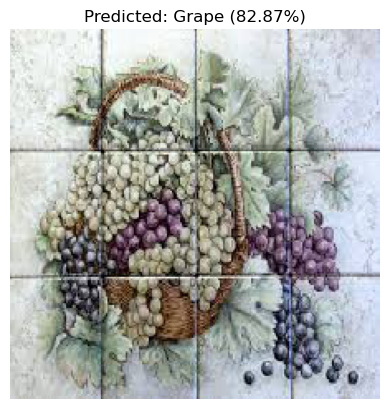

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


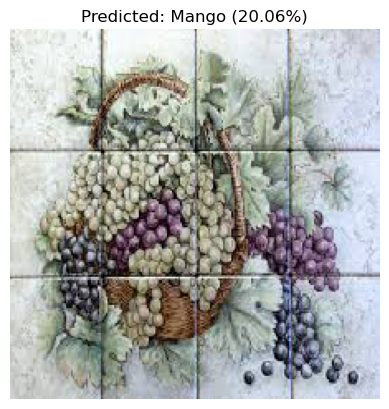

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


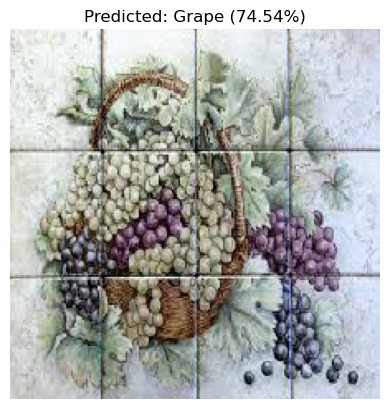

('Grape', 0.74537045)

In [31]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Grape/Grape (567).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


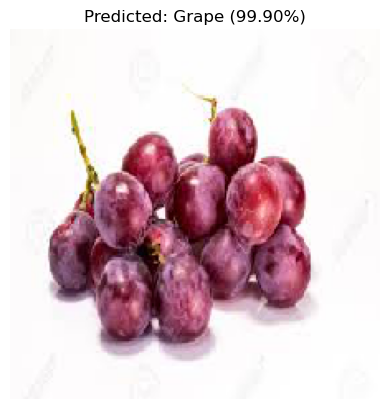

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


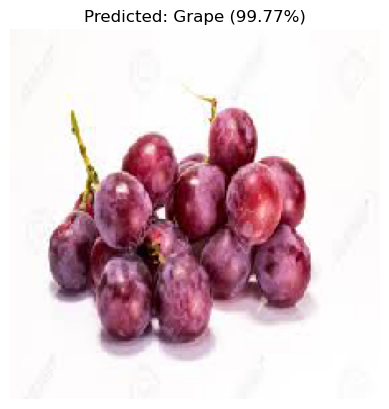

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


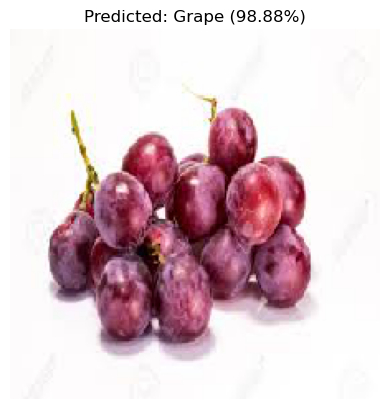

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


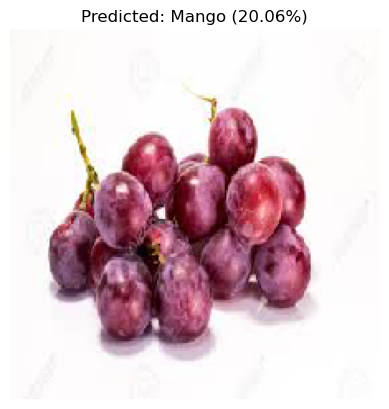

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


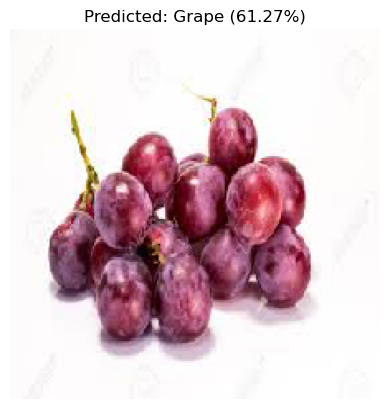

('Grape', 0.6126993)

In [32]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Grape/Grape (1470).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


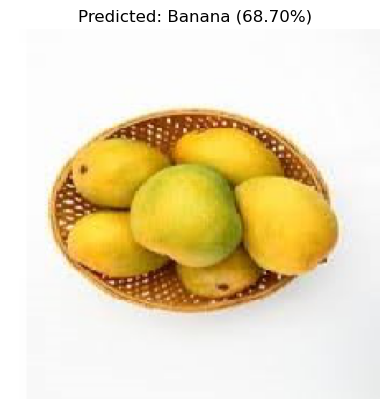

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


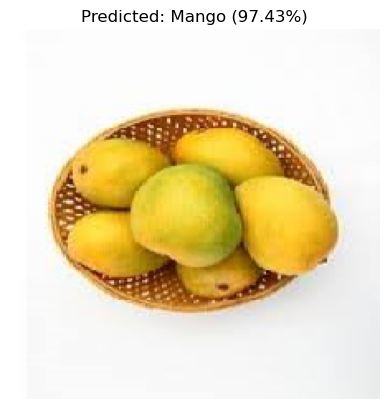

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


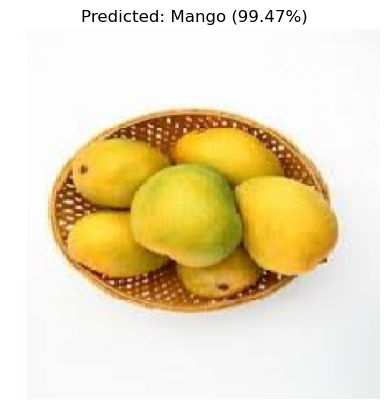

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


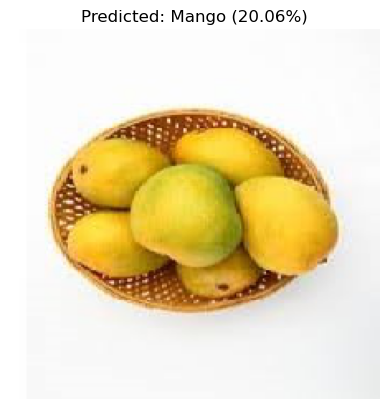

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


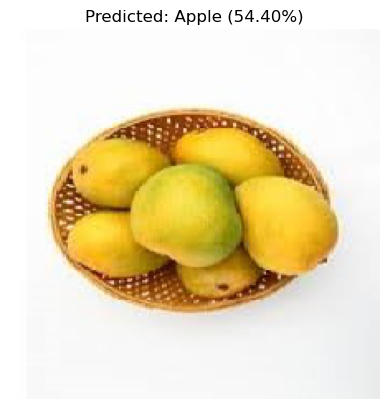

('Apple', 0.5440493)

In [33]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Mango/Mango (275).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


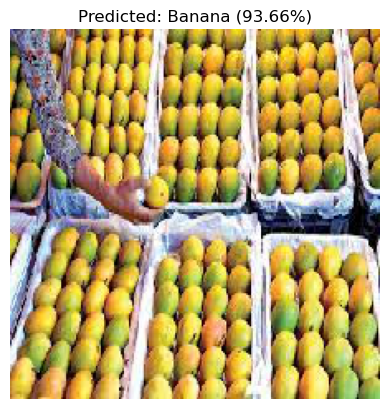

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


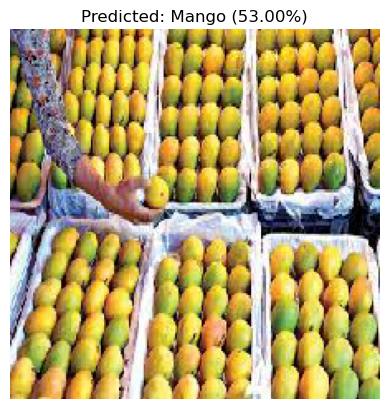

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


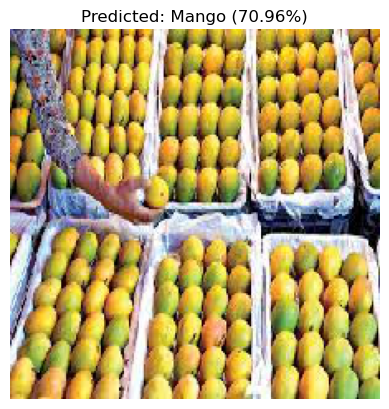

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


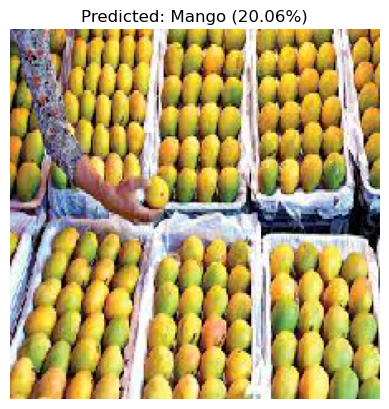

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


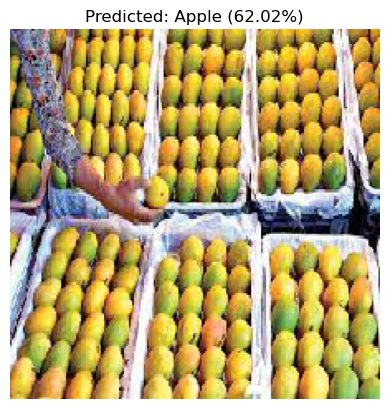

('Apple', 0.62015283)

In [34]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Mango/Mango (768).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


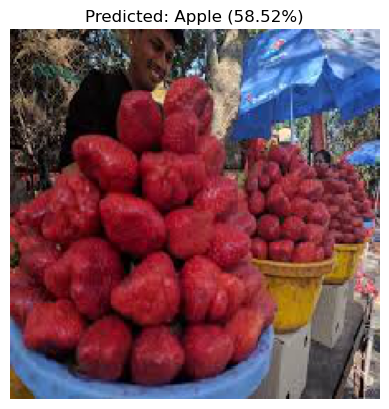

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


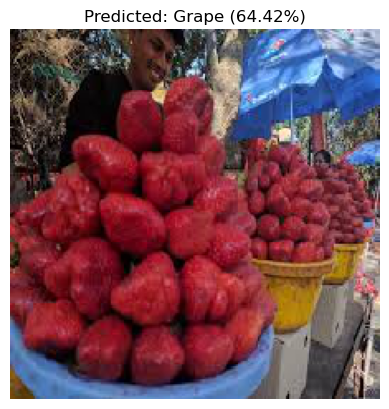

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


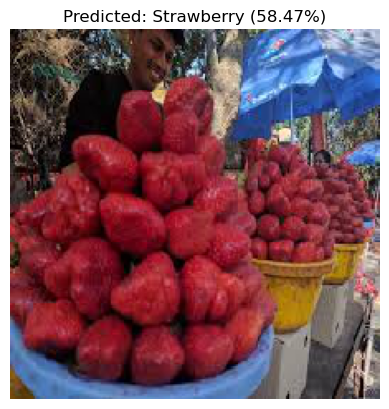

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


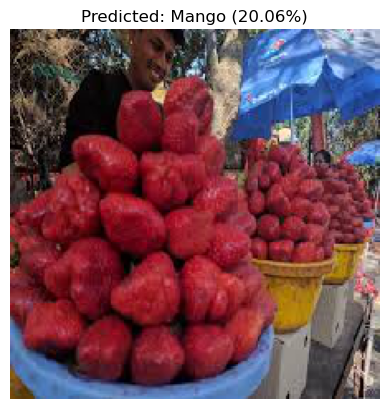

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


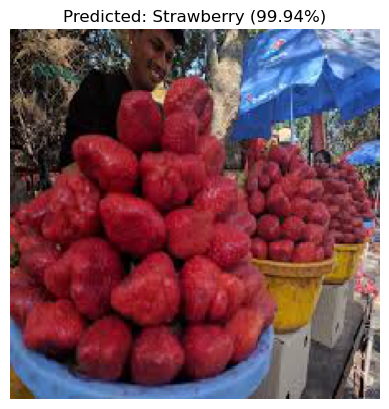

('Strawberry', 0.99936587)

In [35]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Strawberry/Strawberry (639).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


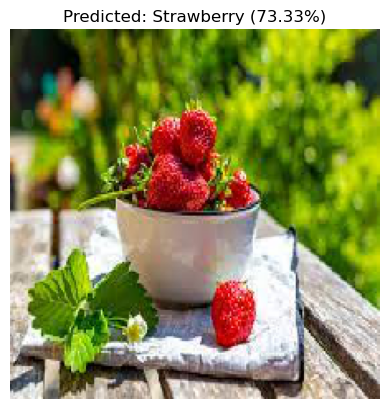

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


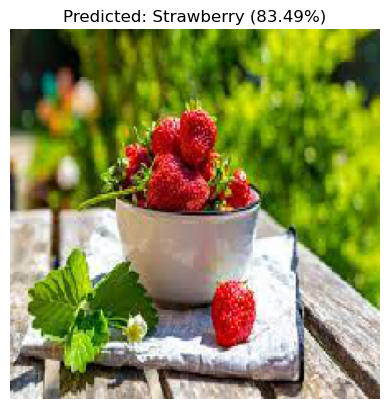

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


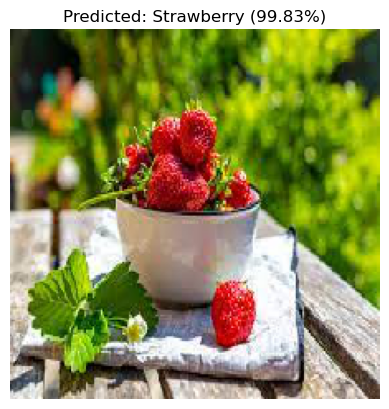

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


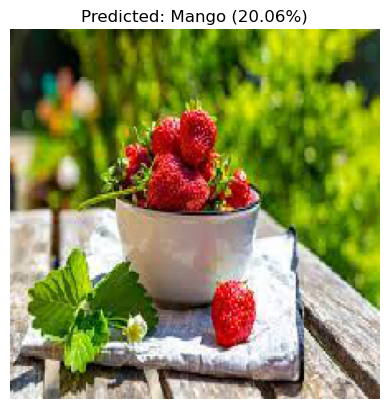

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


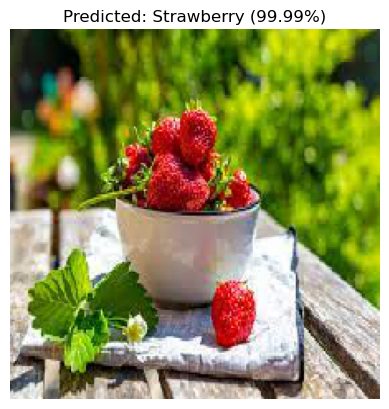

('Strawberry', 0.99992263)

In [36]:
image_path = "F:/ttttt/fruit/Fruits Classification/test/Strawberry/Strawberry (1423).jpeg"
predict_image(cnn_model, image_path, class_names)
predict_image(vgg16_model, image_path, class_names)
predict_image(mobilenet_model, image_path, class_names)
predict_image(efficientnet_model, image_path, class_names)
predict_image(inception_model, image_path, class_names)

Create the performance tracking table

In [37]:
import pandas as pd

# Create a global dataframe to store model results
performance_table = pd.DataFrame(columns=[
    'Model', 'Train Accuracy', 'Validation Accuracy', 'Test Accuracy',
    'Precision', 'Recall', 'F1-Score', 'Loss'
])

In [38]:
def evaluate_and_log_model(model, model_name, history, test_generator, class_names):
    # Evaluate on test data
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=0)
    y_true = test_generator.classes
    y_pred = np.argmax(model.predict(test_generator), axis=1)

    # Classification report
    report = classification_report(y_true, y_pred, output_dict=True, target_names=class_names)

    precision = report['weighted avg']['precision']
    recall = report['weighted avg']['recall']
    f1_score_val = report['weighted avg']['f1-score']

    # Add to global table
    performance_table.loc[len(performance_table)] = {
        'Model': model_name,
        'Train Accuracy': history.history['accuracy'][-1],
        'Validation Accuracy': history.history['val_accuracy'][-1],
        'Test Accuracy': test_accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1_score_val,
        'Loss': test_loss
    }

    # Save plot of accuracy/loss
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Acc')
    plt.plot(history.history['val_accuracy'], label='Val Acc')
    if 'test_accuracy' in history.history:
        plt.plot(history.history['test_accuracy'], label='Test Acc')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    if 'test_loss' in history.history:
        plt.plot(history.history['test_loss'], label='Test Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Save accuracy/loss figure
    plot_filename = f"{model_name.replace(' ', '_')}_metrics.png"
    plt.savefig(plot_filename)
    plt.show()

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation=45)
    plt.title(f'{model_name} - Confusion Matrix')

    # Save confusion matrix
    cm_filename = f"{model_name.replace(' ', '_')}_confusion_matrix.png"
    plt.savefig(cm_filename)
    plt.show()

    print(f"Saved: {plot_filename}, {cm_filename}")


100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


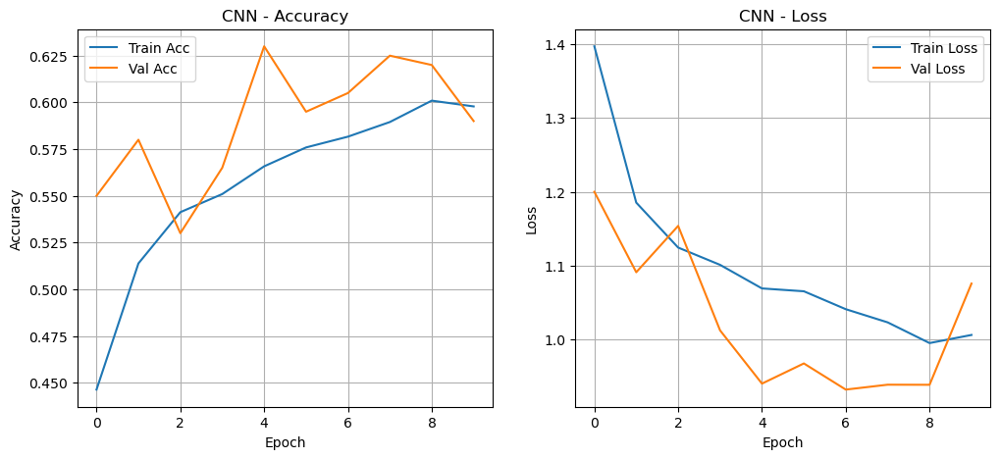

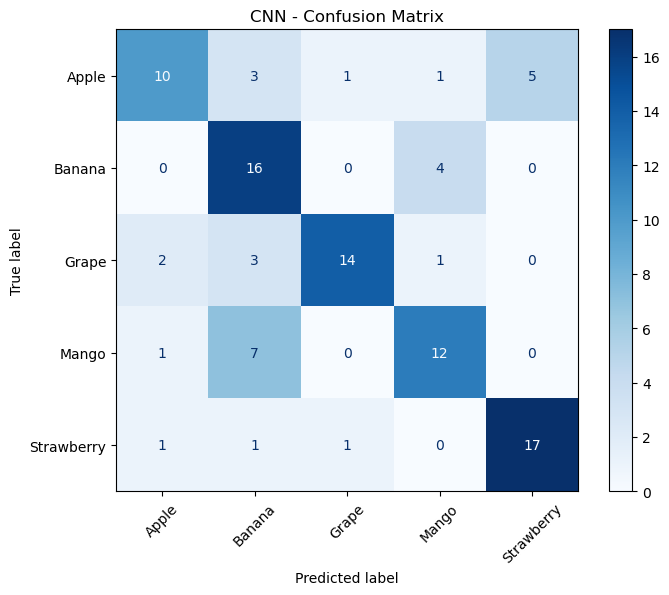

Saved: CNN_metrics.png, CNN_confusion_matrix.png
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step


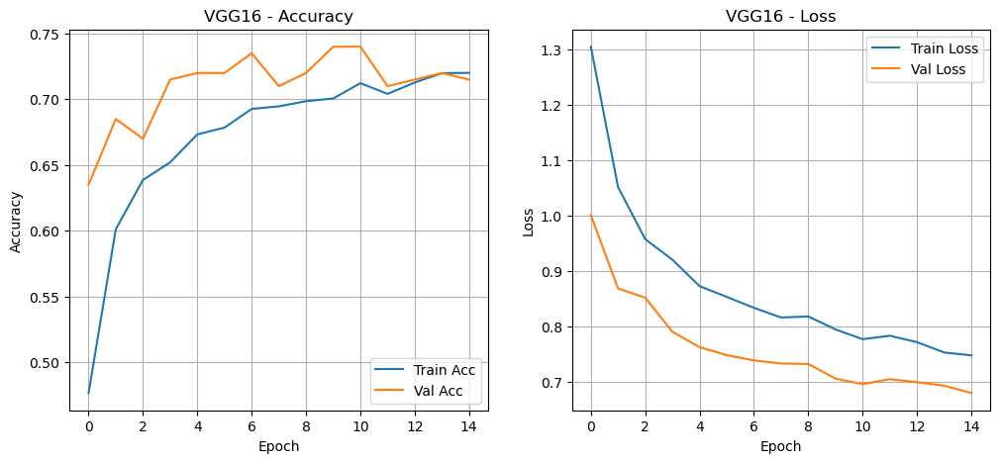

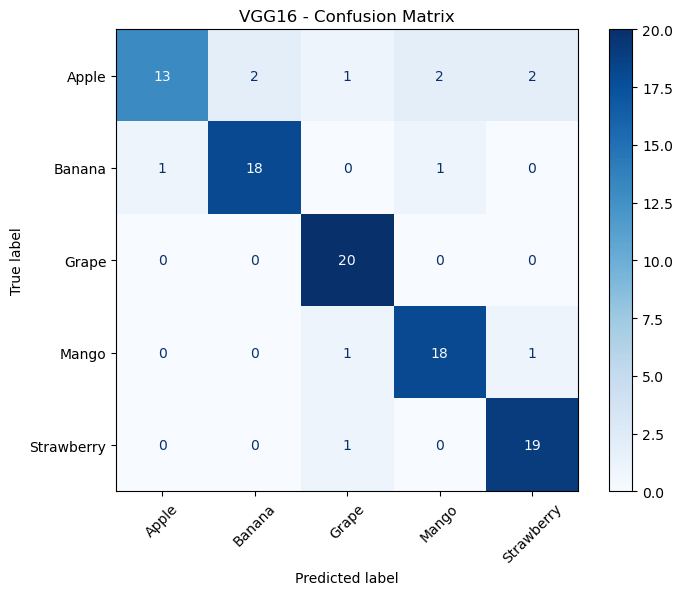

Saved: VGG16_metrics.png, VGG16_confusion_matrix.png
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step


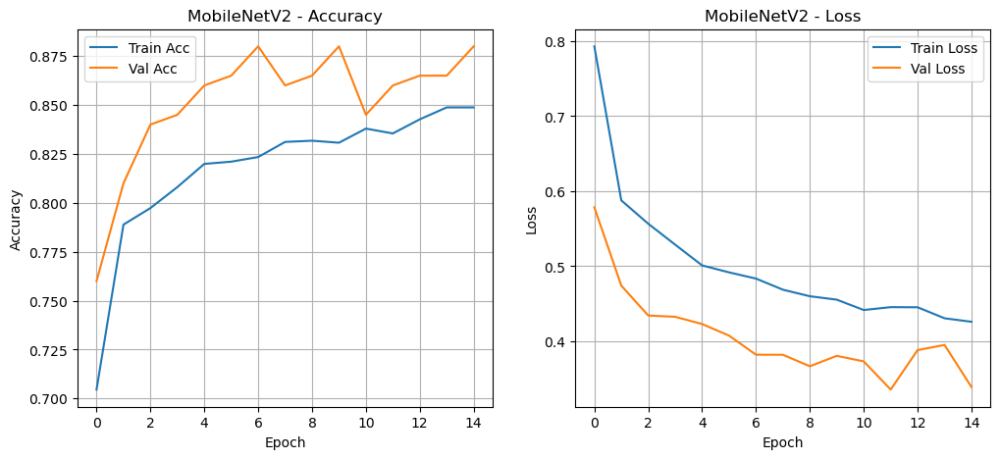

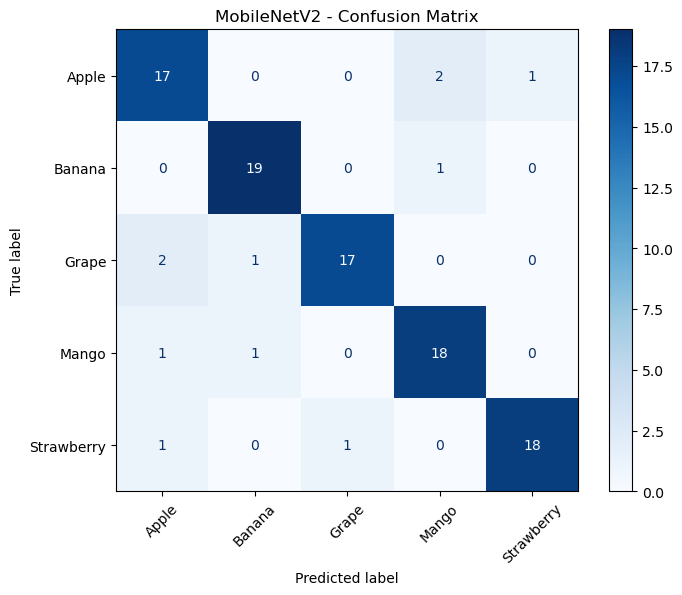

Saved: MobileNetV2_metrics.png, MobileNetV2_confusion_matrix.png
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step


c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


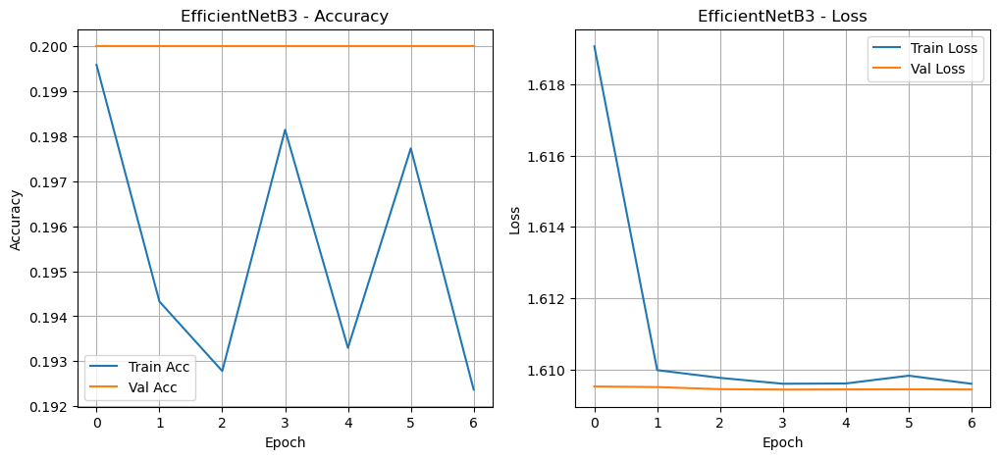

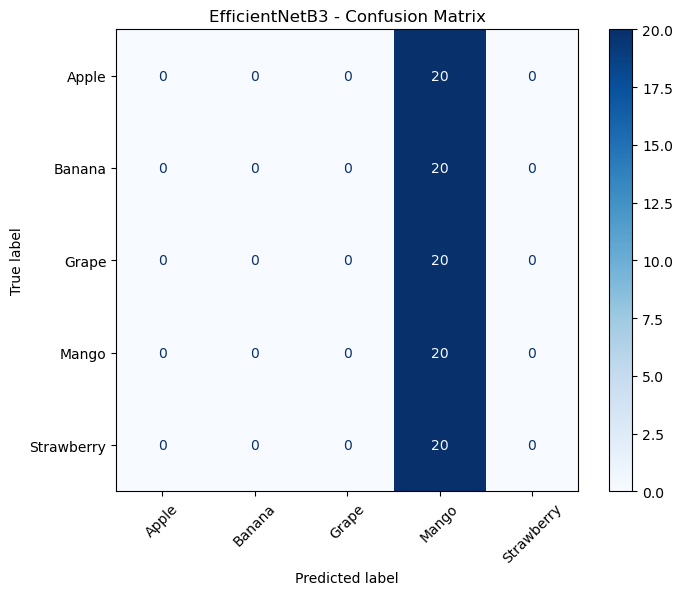

Saved: EfficientNetB3_metrics.png, EfficientNetB3_confusion_matrix.png
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step


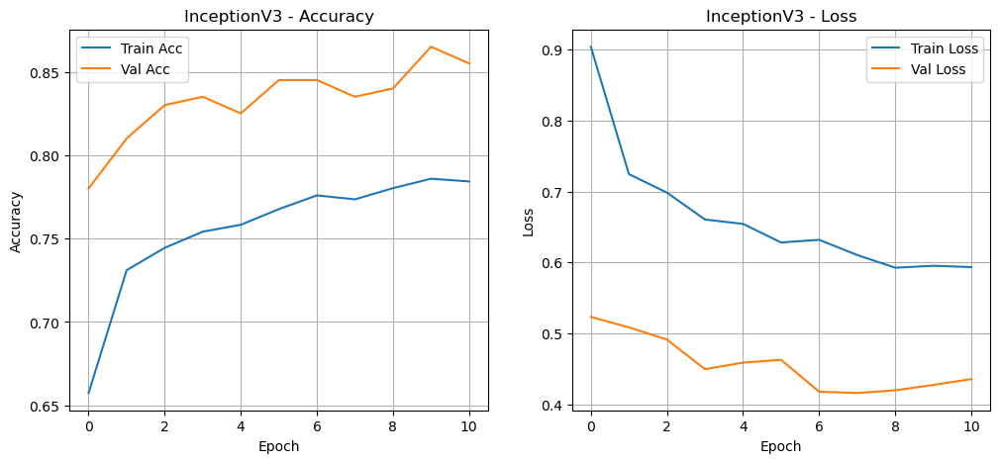

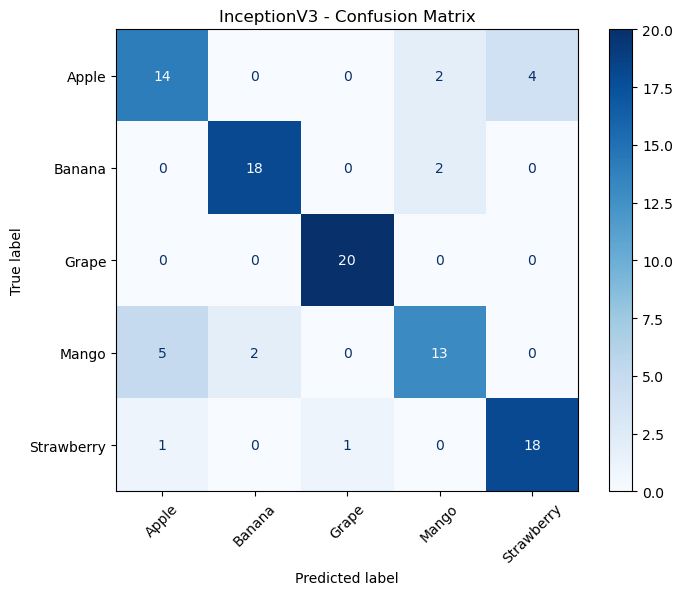

Saved: InceptionV3_metrics.png, InceptionV3_confusion_matrix.png


In [39]:
evaluate_and_log_model(cnn_model, "CNN", cnn_history, test_generator, class_names)
evaluate_and_log_model(vgg16_model, "VGG16", vgg16_history, test_generator, class_names)
evaluate_and_log_model(mobilenet_model, "MobileNetV2", mobilenet_history, test_generator, class_names)
evaluate_and_log_model(efficientnet_model, "EfficientNetB3", efficientnet_history, test_generator, class_names)
evaluate_and_log_model(inception_model, "InceptionV3", inception_history, test_generator, class_names)